In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skincancer/skin.v1i.yolov11/README.dataset.txt
/kaggle/input/skincancer/skin.v1i.yolov11/README.roboflow.txt
/kaggle/input/skincancer/skin.v1i.yolov11/data.yaml
/kaggle/input/skincancer/skin.v1i.yolov11/split.py
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0030971_jpg.rf.66639d490501ddc508813d8fa1278b41.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0033367_jpg.rf.9483e4775e0b4d0d16266fd6bc3d89d3.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0029129_jpg.rf.46b546a2b228039776b7f6212b51684a.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0033988_jpg.rf.a3e25835159d0dfd352dea6410796f4e.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0029820_jpg.rf.601ce8f6b035547809eae177de2f97d3.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0030762_jpg.rf.c91cb70c7c47787ea1ab7ead6c4e4abf.txt
/kaggle/input/skincancer/skin.v1i.yolov11/val/labels/ISIC_0027093_jpg.rf.d8690d5bc58dc6620330be8ca8d7b1b0.txt
/kag

In [2]:
# Pip install method (recommended)
%pip install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 876.6/876.6 kB 17.1 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


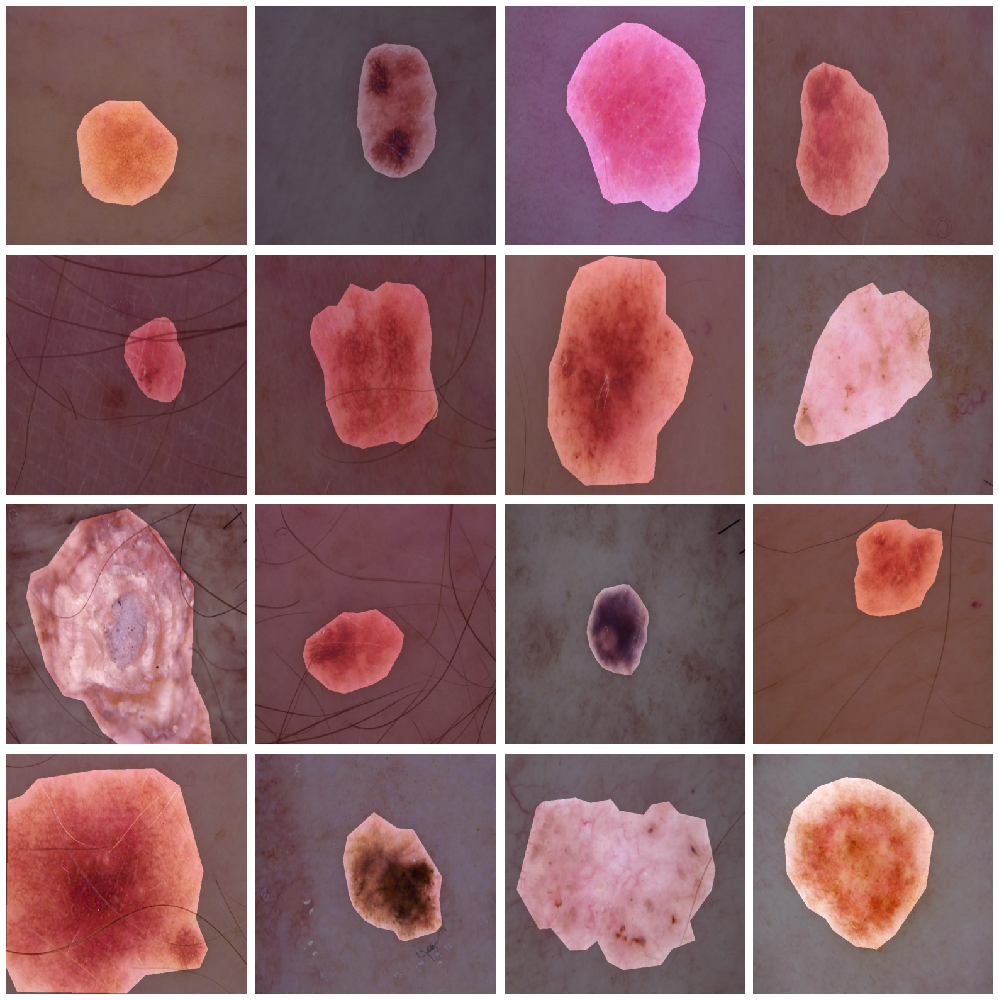

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/skincancer/skin.v1i.yolov11/train/images"
train_labels = "/kaggle/input/skincancer/skin.v1i.yolov11/train/labels"

test_images = "/kaggle/input/skincancer/skin.v1i.yolov11/test/images"
test_labels = "/kaggle/input/skincancer/skin.v1i.yolov11/test/labels"

val_images = "/kaggle/input/skincancer/skin.v1i.yolov11/val/images"
val_labels = "/kaggle/input/skincancer/skin.v1i.yolov11/val/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the segmentations
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)
    
    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    
    # Create a mask of the same size as the image
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")
    
    # Loop over the labels and create segmentation masks
    for label in labels:
        parts = label.split()
        if len(parts) < 5:  # Skip if not enough data
            continue
        class_id = int(parts[0])
        points = list(map(float, parts[1:]))
        
        # Convert normalized coordinates to pixel coordinates
        points = np.array([(points[i] * image.shape[1], points[i+1] * image.shape[0]) 
                           for i in range(0, len(points), 2)], dtype=np.int32)
        
        # Draw filled polygon on mask
        cv2.fillPoly(mask, [points], color=(255))
    
    # Apply the mask to the image
    segmented = cv2.bitwise_and(image, image, mask=mask)
    
    # Blend the original image with the segmentation
    alpha = 0.5
    blended = cv2.addWeighted(image, alpha, segmented, 1-alpha, 0)
    
    # Show the blended image with the segmentations
    axs[row, col].imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/skincancer/skin.v1i.yolov11/train/images/ISIC_0024306_jpg.rf.bc954266071188597aea0854864dcf49.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 640x640 and 3 channels.


In [6]:
# Define the path where you want to save the data.yaml file
yaml_file_path = '/kaggle/working/data.yaml'

# Write the content to the YAML file
with open(yaml_file_path, 'w') as f:
    f.write("""# Dataset Configuration
# Dataset Configuration
path: /kaggle/input/skincancer/skin.v1i.yolov11  # Dataset root directory
train: train/images  # Training images (relative to 'path')
val: val/images    # Validation images (relative to 'path')
test: test/images    # Test images (relative to 'path')


nc: 7
names: ['AKIEC', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'VASC']

roboflow:
  workspace: skinlesion-ob1tz
  project: skin-jrogy
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/skinlesion-ob1tz/skin-jrogy/dataset/1
""")


In [7]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolov8s-seg.pt") 

100%|██████████| 22.8M/22.8M [00:00<00:00, 188MB/s]


In [8]:

# free up GPU memory
torch.cuda.empty_cache()

# Train the model
model.train(
    data='/kaggle/working/data.yaml',  
    epochs=80,
    imgsz=640,
    device='0'                       
)

Ultralytics 8.3.18 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/kaggle/working/data.yaml, epochs=80, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True

100%|██████████| 755k/755k [00:00<00:00, 13.5MB/s]
2024-10-21 10:34:15,939	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-21 10:34:16,462	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 65.1MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/skincancer/skin.v1i.yolov11/train/labels... 6408 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6408/6408 [00:23<00:00, 271.63it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/skincancer/skin.v1i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/skincancer/skin.v1i.yolov11/val/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:02<00:00, 268.25it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/skincancer/skin.v1i.yolov11/val is not writeable, cache not saved.


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/train
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/80      4.87G      0.926      1.841      1.719       1.31         16        640: 100%|██████████| 401/401 [02:29<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.53it/s]

                   all        801        809      0.409      0.306      0.328      0.206      0.402      0.308      0.327      0.229



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/80      4.83G      0.895      1.547      1.228      1.277         23        640: 100%|██████████| 401/401 [02:26<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.461      0.441      0.322      0.225      0.466      0.454      0.332      0.238



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/80      4.82G     0.8979      1.528      1.187      1.274         22        640: 100%|██████████| 401/401 [02:24<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.494       0.43      0.324      0.163      0.492      0.427      0.333      0.181



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/80      4.82G     0.8853      1.535      1.168      1.264         20        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809      0.587      0.412      0.358      0.249      0.589      0.398      0.357      0.249



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/80      4.83G     0.8538      1.473      1.102      1.243         15        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809      0.425      0.546      0.399      0.277      0.422      0.532      0.397      0.279



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/80      4.84G      0.827      1.439      1.069      1.224         20        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.663      0.379      0.437       0.32      0.441      0.587      0.434      0.316



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/80      4.84G     0.7992      1.424      1.049      1.208         19        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809      0.529      0.539      0.488      0.336      0.533      0.531      0.474      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/80      4.78G     0.7977      1.405      1.031      1.209         19        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809      0.512      0.556      0.466      0.339      0.505      0.541      0.438      0.317



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/80       4.8G     0.7908      1.389      1.027      1.197         17        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809       0.48      0.563      0.464      0.346      0.483      0.563      0.464      0.332



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/80      4.82G     0.7903      1.395      1.021      1.199         23        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.547       0.61      0.501      0.367      0.547      0.608      0.501      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/80      4.82G     0.7721      1.345     0.9811      1.186         21        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.595       0.42      0.411      0.286      0.592      0.417      0.407      0.281



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/80      4.82G     0.7628       1.35     0.9736      1.185         21        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.66it/s]

                   all        801        809      0.509      0.585      0.484      0.348      0.507      0.586      0.486       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/80      4.82G     0.7658      1.356     0.9748      1.187         18        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.637      0.558      0.516      0.384      0.636      0.554      0.512      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/80      4.82G     0.7509      1.347      0.969       1.18         19        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.597      0.528      0.513      0.372      0.591      0.529      0.504      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/80      4.82G     0.7562       1.33     0.9566      1.177         16        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.56it/s]

                   all        801        809      0.575      0.574      0.576      0.413      0.563       0.59      0.575      0.399



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/80      4.82G     0.7443      1.325     0.9436      1.172         16        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.583      0.563      0.544      0.382      0.579      0.558       0.53      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/80      4.81G     0.7534      1.337      0.954      1.179         19        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809      0.584      0.566      0.523      0.375      0.581       0.56      0.514      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/80      4.85G     0.7363      1.318     0.9175      1.163         11        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.621      0.563      0.533      0.397       0.63      0.571      0.542      0.387



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/80      4.81G      0.732      1.311     0.9335      1.164         19        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.64it/s]

                   all        801        809      0.609      0.573      0.583      0.421       0.59      0.565      0.568      0.412



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/80      4.81G     0.7291      1.293     0.9063      1.163         16        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809        0.6      0.526       0.57      0.423      0.593       0.52      0.569      0.394



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/80      4.82G      0.728      1.289     0.9155       1.16         18        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.59it/s]

                   all        801        809      0.618      0.565      0.568      0.418      0.623      0.571      0.573      0.415



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/80       4.8G     0.7068      1.275     0.9121      1.149         22        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.511      0.689      0.611      0.457      0.512      0.691      0.612      0.443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/80      4.84G      0.715      1.267     0.8871      1.154         19        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.64it/s]

                   all        801        809      0.626      0.577      0.552      0.433      0.615      0.585      0.548      0.419



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/80      4.82G     0.7066      1.268     0.8881      1.142         19        640: 100%|██████████| 401/401 [02:22<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.64it/s]

                   all        801        809      0.608      0.572      0.586      0.446      0.602      0.572      0.581      0.436



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/80      4.78G     0.7048      1.261     0.8661      1.143         21        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809        0.6      0.641      0.612      0.466      0.599      0.643      0.613      0.459



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/80      4.84G     0.7016      1.263     0.8723      1.143         25        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.64it/s]

                   all        801        809      0.479      0.711      0.636      0.479      0.474      0.704      0.627      0.459



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/80      4.82G     0.6932      1.233     0.8639      1.134         24        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.64it/s]

                   all        801        809      0.657      0.631      0.621      0.476      0.668      0.623      0.634      0.468



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/80      4.81G      0.692      1.243     0.8487      1.138         25        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.536      0.657      0.624       0.46      0.537      0.662      0.627       0.45



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/80      4.83G     0.6918      1.241      0.846      1.136         25        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.66it/s]

                   all        801        809      0.726      0.588      0.639      0.489      0.723      0.583      0.644      0.466



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/80      4.84G     0.6934      1.237     0.8341      1.132         18        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809      0.548      0.727      0.649      0.486      0.546      0.723      0.645      0.476



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/80      4.83G     0.6875       1.23     0.8361      1.133         20        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809      0.601       0.66       0.66      0.489      0.619      0.658      0.672      0.474



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/80      4.81G     0.6827      1.223     0.8253      1.126         14        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809       0.63      0.673      0.667      0.505      0.626      0.668      0.661       0.49



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/80      4.85G     0.6779      1.226     0.8243      1.124         20        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.645      0.604       0.65       0.49      0.658      0.606      0.653      0.484



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/80      4.81G     0.6639      1.197     0.8063       1.12         25        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.601      0.682      0.656      0.512      0.607      0.673      0.661        0.5



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/80      4.84G     0.6688      1.199     0.8029      1.124         20        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.643      0.637       0.68      0.525      0.644      0.638      0.683      0.508



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/80      4.82G     0.6637      1.195     0.7925      1.119         21        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.623      0.676      0.678      0.515      0.617      0.672      0.671      0.503



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/80      4.79G     0.6721      1.197     0.7975      1.124         25        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.59it/s]

                   all        801        809      0.611      0.693      0.687      0.516      0.615      0.698      0.696      0.508



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/80      4.79G     0.6714      1.205     0.7995      1.118         19        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.689      0.626      0.656      0.495      0.691       0.65      0.668      0.488



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/80      4.83G     0.6653      1.189     0.7788      1.118         18        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.60it/s]

                   all        801        809      0.603      0.649      0.658      0.503      0.604      0.651      0.659      0.495



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/80      4.82G      0.663      1.195     0.7816      1.119         18        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.64it/s]

                   all        801        809      0.693      0.659      0.675      0.524      0.696      0.666      0.683      0.517



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/80      4.82G     0.6565      1.184      0.771      1.116         14        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.714      0.572      0.673      0.519      0.713      0.572      0.674      0.507



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/80      4.82G      0.652      1.181     0.7651      1.109         13        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.677      0.708      0.697      0.528      0.668      0.708      0.694      0.519



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/80      4.81G     0.6466      1.163      0.754      1.105         23        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809       0.64      0.657      0.678      0.521      0.598      0.709      0.677      0.509



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/80      4.79G     0.6439      1.169      0.749      1.108         17        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809       0.62      0.696      0.686      0.532      0.625        0.7      0.691      0.521



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/80      4.82G     0.6541      1.183     0.7545      1.112         11        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.671      0.666      0.689      0.527      0.675       0.67      0.692      0.513



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/80      4.83G     0.6501      1.173     0.7421      1.108         21        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809      0.649      0.657      0.692      0.527      0.652      0.662      0.695      0.524



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/80      4.83G     0.6397      1.161     0.7364      1.103         23        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809       0.79      0.643      0.731      0.555      0.794      0.648      0.732      0.543



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/80       4.8G     0.6463       1.15      0.723        1.1         17        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.66it/s]

                   all        801        809        0.6      0.714      0.689      0.531      0.606      0.728      0.696      0.517



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/80      4.82G     0.6391       1.15     0.7252        1.1         20        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.61it/s]

                   all        801        809      0.646      0.687        0.7       0.54      0.647      0.689      0.702      0.526



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/80       4.8G     0.6291      1.142     0.7075      1.091         20        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.67it/s]

                   all        801        809      0.709      0.641       0.71      0.541      0.704      0.637      0.702      0.529



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/80      4.81G     0.6357      1.146     0.7144      1.097         25        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.66it/s]

                   all        801        809      0.642       0.68      0.719      0.551      0.645      0.684      0.723      0.535



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/80      4.84G     0.6239      1.149     0.7076      1.093         17        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809       0.62      0.712      0.701      0.548      0.624      0.717      0.707      0.539



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/80      4.82G     0.6222      1.131     0.6999      1.092         26        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.60it/s]

                   all        801        809      0.695      0.709      0.735      0.567      0.698      0.714      0.743      0.561



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/80      4.81G     0.6203      1.133      0.687      1.085         23        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.678       0.67      0.723      0.553      0.645      0.711      0.726      0.544



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/80      4.81G     0.6146       1.12     0.6807      1.085         17        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.67it/s]

                   all        801        809      0.789      0.629      0.717      0.554      0.773      0.638       0.72       0.55



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/80       4.8G      0.605      1.109     0.6602      1.078         18        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.64it/s]

                   all        801        809      0.705      0.682       0.74       0.57      0.709      0.687      0.746      0.557



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      57/80      4.85G     0.6072      1.103     0.6511      1.079         18        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.68it/s]

                   all        801        809      0.648      0.711      0.732      0.574      0.651      0.712      0.735      0.561



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      58/80      4.84G     0.6171      1.118     0.6664      1.085         21        640: 100%|██████████| 401/401 [02:24<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.664       0.71      0.723      0.558      0.668      0.711      0.726      0.552



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      59/80      4.84G     0.6116       1.12     0.6661       1.08         17        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.66it/s]

                   all        801        809      0.684      0.679       0.72      0.564      0.688      0.684      0.723      0.551



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      60/80      4.77G     0.6047      1.099     0.6607      1.076         19        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.769      0.639      0.738      0.583      0.783      0.642      0.738      0.569



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      61/80      4.83G     0.6082      1.112     0.6547       1.08         20        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.779      0.666      0.745      0.582      0.747      0.688      0.744      0.574



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      62/80      4.84G     0.5969      1.086     0.6365      1.073         18        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.722      0.724      0.747      0.583      0.728      0.732      0.753      0.571



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      63/80      4.82G      0.594      1.074     0.6228      1.068         23        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.66it/s]

                   all        801        809      0.675       0.75      0.741      0.577       0.67      0.746      0.737      0.566



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      64/80      4.79G     0.5961      1.087     0.6298      1.075         16        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.728      0.672      0.757      0.577      0.731      0.679      0.749      0.571



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      65/80      4.82G     0.5933      1.083     0.6216      1.073         24        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.69it/s]

                   all        801        809      0.638      0.741      0.752      0.577      0.634      0.747      0.747      0.569



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      66/80      4.83G     0.5845      1.073     0.6066      1.066         18        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.734       0.69      0.748      0.581      0.755      0.683      0.749      0.582



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      67/80      4.84G     0.5897      1.081     0.6168      1.068         22        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.67it/s]

                   all        801        809      0.741      0.693      0.755       0.58      0.743      0.687      0.756      0.577



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      68/80      4.82G      0.585       1.07     0.5965      1.066         22        640: 100%|██████████| 401/401 [02:24<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.60it/s]

                   all        801        809      0.743      0.679      0.747      0.582      0.731      0.686      0.746      0.573



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      69/80      4.84G     0.5784      1.063     0.5999      1.063         24        640: 100%|██████████| 401/401 [02:23<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.752       0.69      0.749      0.589      0.763        0.7      0.759      0.583



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      70/80      4.84G     0.5776      1.064     0.5843       1.06         20        640: 100%|██████████| 401/401 [02:23<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.712      0.733      0.756      0.597      0.724      0.744      0.766      0.584


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      71/80      4.76G     0.4433     0.8391     0.4202      1.032          9        640: 100%|██████████| 401/401 [02:23<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.68it/s]

                   all        801        809      0.756      0.706      0.755      0.606      0.765      0.718      0.764       0.59



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      72/80      4.74G     0.4364     0.8234     0.3953      1.022          8        640: 100%|██████████| 401/401 [02:22<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.66it/s]

                   all        801        809      0.708      0.723      0.759      0.598      0.709      0.728      0.759      0.587



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      73/80      4.78G     0.4336     0.8184     0.3929      1.024          8        640: 100%|██████████| 401/401 [02:22<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.62it/s]

                   all        801        809      0.697      0.703       0.76      0.603      0.698      0.718      0.767      0.587



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      74/80      4.77G     0.4273     0.8125     0.3837      1.012          8        640: 100%|██████████| 401/401 [02:22<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.66it/s]

                   all        801        809      0.729      0.703      0.752      0.594      0.734      0.708      0.762      0.579



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      75/80      4.76G     0.4171     0.8065      0.365       1.01          8        640: 100%|██████████| 401/401 [02:22<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.64it/s]

                   all        801        809      0.769      0.678       0.76      0.602      0.774      0.683      0.766       0.59



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      76/80      4.74G     0.4169     0.7953     0.3567      1.003          8        640: 100%|██████████| 401/401 [02:22<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.63it/s]

                   all        801        809      0.743      0.721      0.761      0.609      0.747      0.726      0.766      0.595



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      77/80      4.77G      0.415      0.798     0.3614      1.005          8        640: 100%|██████████| 401/401 [02:22<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.67it/s]

                   all        801        809      0.733      0.717      0.758      0.608      0.737      0.722      0.764      0.596



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      78/80      4.76G     0.4057     0.7883     0.3397     0.9946          8        640: 100%|██████████| 401/401 [02:22<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.67it/s]

                   all        801        809      0.705      0.742      0.757      0.604      0.703      0.743      0.755      0.591



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      79/80      4.76G     0.3996     0.7852      0.341     0.9897          8        640: 100%|██████████| 401/401 [02:21<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.69it/s]

                   all        801        809      0.724      0.714      0.754      0.603      0.723      0.714      0.753       0.59



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      80/80      4.75G     0.3998     0.7811     0.3288     0.9944          8        640: 100%|██████████| 401/401 [02:21<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.65it/s]

                   all        801        809      0.691      0.755      0.755      0.599       0.69      0.757      0.753      0.588



80 epochs completed in 3.437 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 23.9MB
Optimizer stripped from runs/segment/train/weights/best.pt, 23.9MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.18 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,782,309 parameters, 0 gradients, 42.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.52it/s]


                   all        801        809      0.746       0.71      0.761      0.609       0.75      0.714      0.766      0.595
                 AKIEC         34         34      0.848      0.492      0.687      0.503      0.848      0.491      0.687      0.461
                   BCC         30         30      0.514       0.67      0.584      0.386      0.539      0.702      0.622       0.37
                   BKL         88         88      0.746      0.784      0.829      0.669      0.746      0.784      0.829      0.656
                    DF          8          8      0.588        0.5      0.558      0.394      0.589        0.5      0.558      0.387
                   MEL         85         86      0.702      0.651      0.718      0.638      0.703      0.651      0.718      0.629
                    NV        554        554      0.929      0.931      0.975      0.898      0.931      0.933      0.975      0.888
                  VASC          9          9      0.894      0.938   

lr/pg0,████▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁
lr/pg1,▃████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁
lr/pg2,▃▆████▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▄▃▃▄▄▄▄▄▅▆▅▅▆▆▆▆▆▇▇▆▇▇▇▇▇▇▇▇█▇█▇███████
metrics/mAP50(M),▁▁▁▂▃▃▂▄▄▄▆▅▆▆▆▆▇▆▇▆▇▇▇▇▇▇▇▇████████████
metrics/mAP50-95(B),▂▁▂▃▄▄▃▄▄▅▄▅▅▅▅▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇██████████
metrics/mAP50-95(M),▁▁▂▃▃▄▄▄▄▄▅▅▅▆▅▆▆▆▆▆▇▆▆▇▆▇▇▇▇▇▇█████████
metrics/precision(B),▂▄▁▆▃▅▄▄▄▅▄▅▄▃▇▅▅▅▆▅▆▅█▅▆▅▆▆▆▅▆▇▇▅▇▇▇▆▇▇
metrics/precision(M),▁▃▄▄▄▄▃▅▅▂▇▃▅▅▆▅▅▇▅▆▅▅▇▅▆▆▆▇▆▇▇▇█▇█▇█▇▇█
metrics/recall(B),▁▁▄▄▁▄▃▄▄▄▄▃▇▄▆▅█▆▇▆▄▇▆▇▆▆▇▇▇▆█▇▇▇▇▇▇█▇▇
metrics/recall(M),▁▃▅▅▆▅▅▅▅▅▅▄▇▅▆▅▇▆▇▆▆▇▅▇▇▆▇█▇▆▇██▇▇██▇█▇


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e913849fca0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04

In [9]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/segment/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.18 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,782,309 parameters, 0 gradients, 42.5 GFLOPs


val: Scanning /kaggle/input/skincancer/skin.v1i.yolov11/test/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:03<00:00, 220.50it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/skincancer/skin.v1i.yolov11/test is not writeable, cache not saved.


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:15<00:00,  3.22it/s]


                   all        801        804      0.772      0.731       0.78      0.623      0.769      0.728      0.777      0.619
                 AKIEC         19         19      0.721      0.421      0.514       0.34      0.721      0.421      0.514      0.281
                   BCC         30         30      0.659        0.8      0.792       0.47      0.659        0.8      0.794      0.516
                   BKL        107        107      0.804      0.804      0.835      0.691      0.785      0.785      0.813       0.69
                    DF          8          8      0.608      0.625      0.714      0.602      0.608      0.625      0.714      0.595
                   MEL         85         85      0.694      0.706      0.751      0.684      0.694      0.706      0.751      0.679
                    NV        543        543      0.921      0.941      0.949      0.882      0.919      0.939      0.948      0.869
                  VASC         12         12          1      0.818   

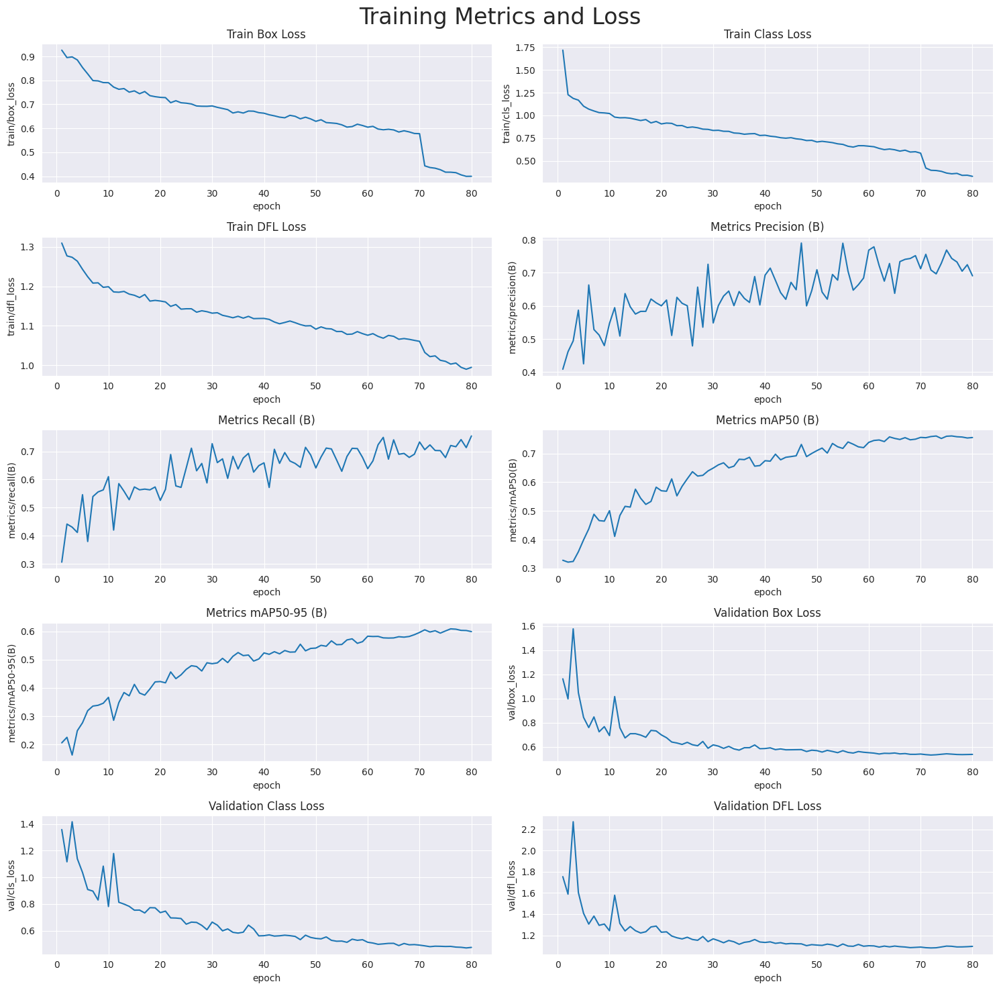

In [10]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/segment/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [11]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 640x640 1 NV, 27.0ms
Speed: 2.8ms preprocess, 27.0ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NV, 27.1ms
Speed: 3.0ms preprocess, 27.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NV, 27.0ms
Speed: 2.1ms preprocess, 27.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NV, 27.0ms
Speed: 2.8ms preprocess, 27.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 BCC, 27.0ms
Speed: 3.0ms preprocess, 27.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 BKL, 1 MEL, 27.0ms
Speed: 2.9ms preprocess, 27.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NV, 18.6ms
Speed: 3.0ms preprocess, 18.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 BCC, 18.6ms
Speed: 3.3ms preprocess, 18.6ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 

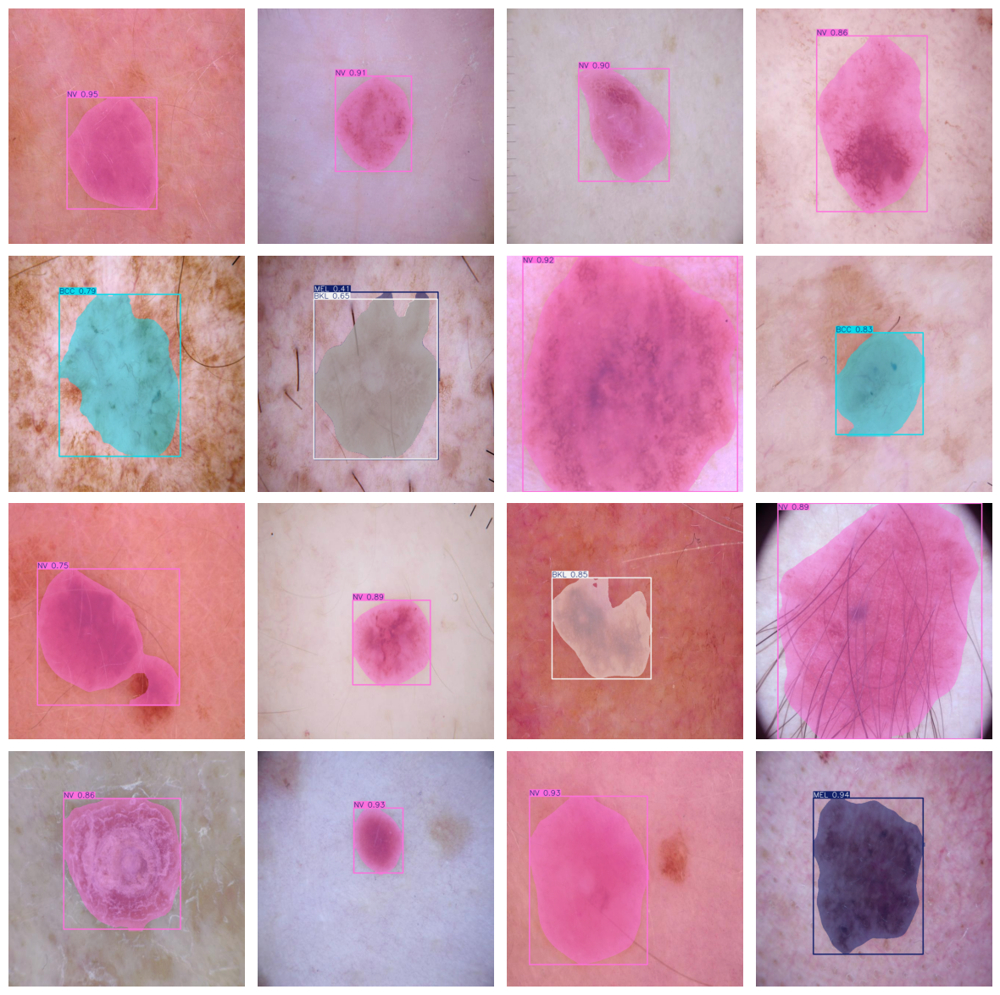

In [12]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [13]:

# Path to your trained model weights
model_weights_path = '/kaggle/working/runs/segment/train/weights/best.pt'

# Load the trained YOLO model
trained_model = YOLO(model_weights_path)

# Path to your test images directory (assuming all images are directly in this folder)
test_images_path = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Perform predictions on all images in the test folder
predictions = trained_model.predict(
    source=test_images_path,
    conf=0.25,  # Confidence threshold
    save_txt=True,  # Save predictions as text files
    save_conf=True  # Save confidence scores
)

# Output predictions
print('Predictions:', predictions)



image 1/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024307_jpg.rf.27e543b324676c71a6bdd91256abf399.jpg: 640x640 1 NV, 27.1ms
image 2/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024308_jpg.rf.c9259576bf8103b3f988aa95f9da0c37.jpg: 640x640 1 NV, 27.1ms
image 3/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024316_jpg.rf.a1e2d69a36d303e9dad85aa1639c36a5.jpg: 640x640 1 NV, 27.0ms
image 4/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024342_jpg.rf.db30e538ec17cdca2f8074bcd236a260.jpg: 640x640 1 NV, 27.0ms
image 5/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024352_jpg.rf.ace6d8e5136b7386fde01b99442c1807.jpg: 640x640 1 NV, 27.1ms
image 6/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024377_jpg.rf.4bf21ed8dd71d8ecd350f428eaef87de.jpg: 640x640 1 NV, 27.1ms
image 7/801 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0024381_jpg.rf.cd0276735ad792e7e6d99f84de981aa4.jpg: 640x6


image 1/1 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0026683_jpg.rf.75d056ab609e257bd8edb275fadb97a3.jpg: 640x640 1 NV, 13.0ms
Speed: 2.1ms preprocess, 13.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
795 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'AKIEC', 1: 'BCC', 2: 'BKL', 3: 'DF', 4: 'MEL', 5: 'NV', 6: 'VASC'}
obb: None
orig_img: array([[[168, 156, 244],
        [167, 155, 243],
        [167, 155, 243],
        ...,
        [166, 153, 233],
        [166, 153, 233],
        [166, 153, 233]],

       [[167, 155, 243],
        [167, 155, 243],
        [166, 154, 242],
        ...,
        [166, 153, 233],
        [166, 153, 233],
        [167, 154, 234]],

       [[166, 154, 242],
        [166, 154, 242],
    

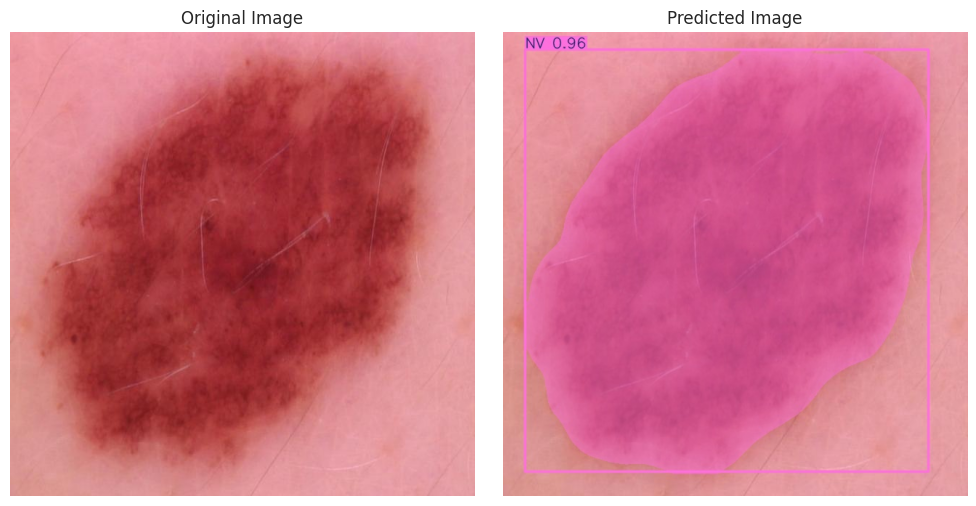

In [14]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()



image 1/1 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0030000_jpg.rf.b2c4f163cde377997e3331e24580d90f.jpg: 640x640 1 NV, 13.0ms
Speed: 1.6ms preprocess, 13.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
795 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'AKIEC', 1: 'BCC', 2: 'BKL', 3: 'DF', 4: 'MEL', 5: 'NV', 6: 'VASC'}
obb: None
orig_img: array([[[189, 173, 244],
        [185, 169, 240],
        [182, 166, 237],
        ...,
        [154, 141, 217],
        [155, 142, 218],
        [157, 144, 220]],

       [[189, 173, 244],
        [186, 170, 241],
        [183, 167, 238],
        ...,
        [157, 144, 220],
        [158, 145, 221],
        [158, 145, 221]],

       [[188, 171, 244],
        [186, 169, 242],
    

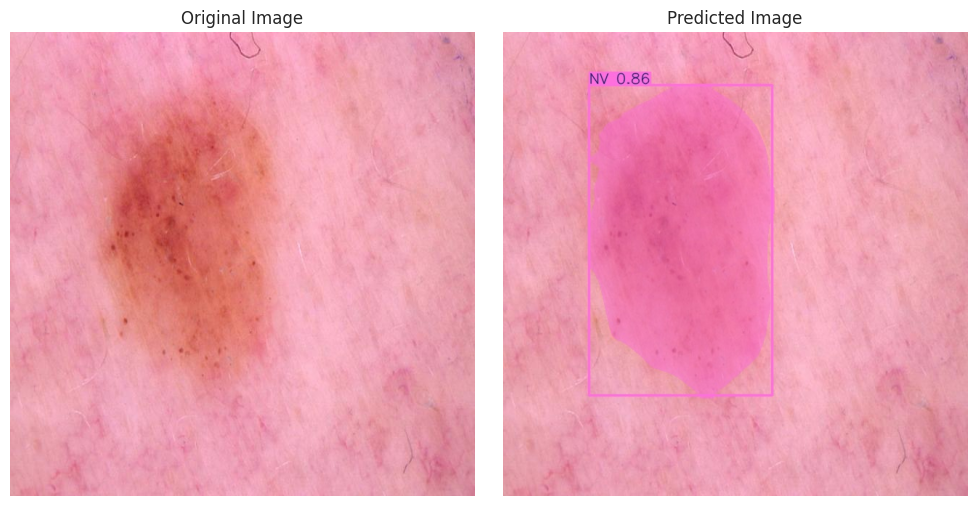

In [15]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()



image 1/1 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0031757_jpg.rf.351a878c0dc0966ee692f20ae3d8106b.jpg: 640x640 1 NV, 27.1ms
Speed: 1.7ms preprocess, 27.1ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
795 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'AKIEC', 1: 'BCC', 2: 'BKL', 3: 'DF', 4: 'MEL', 5: 'NV', 6: 'VASC'}
obb: None
orig_img: array([[[  9,   7,  13],
        [ 10,   8,  14],
        [ 11,   9,  15],
        ...,
        [ 87,  87, 103],
        [ 85,  86, 100],
        [ 83,  84,  98]],

       [[  9,   7,  13],
        [ 10,   8,  14],
        [ 11,   9,  15],
        ...,
        [ 88,  88, 104],
        [ 86,  87, 101],
        [ 84,  85,  99]],

       [[  9,   7,  13],
        [ 10,   8,  14],
    

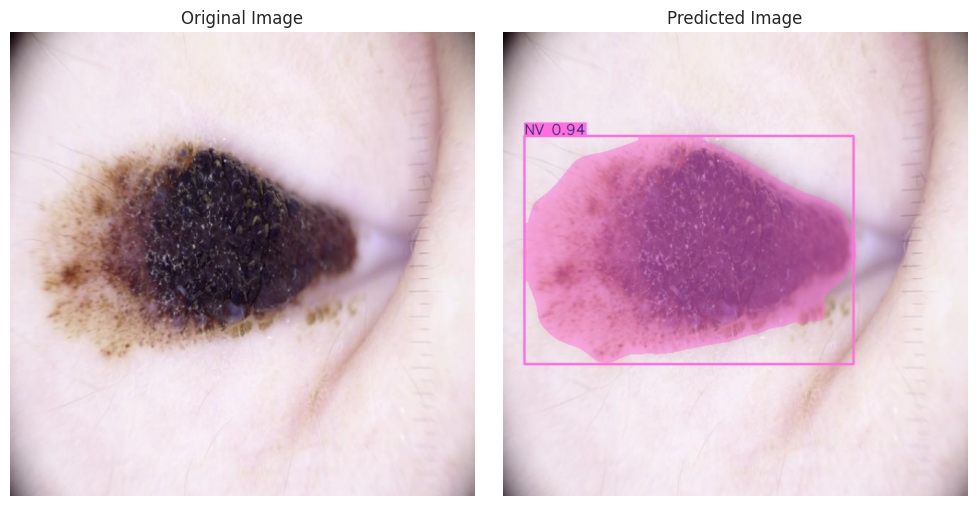

In [16]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()



image 1/1 /kaggle/input/skincancer/skin.v1i.yolov11/test/images/ISIC_0032823_jpg.rf.6967445d116ecce40fd08256ff9540ec.jpg: 640x640 1 MEL, 27.2ms
Speed: 1.7ms preprocess, 27.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
795 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'AKIEC', 1: 'BCC', 2: 'BKL', 3: 'DF', 4: 'MEL', 5: 'NV', 6: 'VASC'}
obb: None
orig_img: array([[[157, 145, 165],
        [157, 145, 165],
        [157, 145, 165],
        ...,
        [184, 179, 181],
        [183, 178, 180],
        [182, 177, 179]],

       [[157, 145, 165],
        [158, 146, 166],
        [158, 146, 166],
        ...,
        [185, 180, 182],
        [185, 180, 182],
        [184, 179, 181]],

       [[158, 146, 166],
        [158, 146, 166],
   

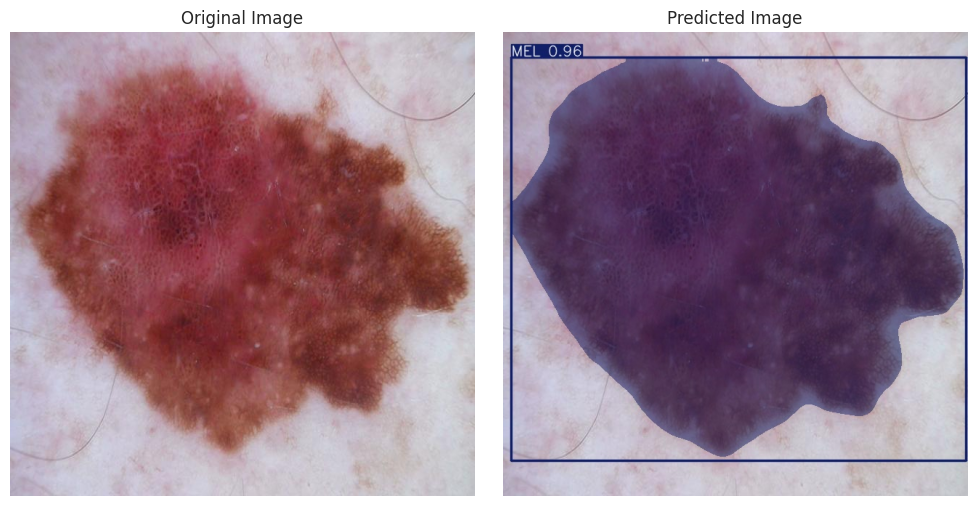

In [17]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skincancer/skin.v1i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()


In [18]:
import shutil

# Define the path to the 'train' directory
train_dir = '/kaggle/working/runs/segment/train'

# Define the output path for the ZIP file (excluding the '.zip' extension)
output_path = '/kaggle/working/train_archive'

# Create the ZIP archive
shutil.make_archive(output_path, 'zip', train_dir)



'/kaggle/working/train_archive.zip'